# Data Preprocessing

In [1]:
# https://drive.google.com/file/d/10hJWq31LTfQhnuUIgIKlgFcDFjwjFO1v/view?usp=sharing

! gdown --id 10hJWq31LTfQhnuUIgIKlgFcDFjwjFO1v

/usr/local/lib/python3.10/dist-packages/gdown/cli.py:121: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=10hJWq31LTfQhnuUIgIKlgFcDFjwjFO1v
To: /content/otus_basketball_dataset.zip
100% 109M/109M [00:01<00:00, 75.5MB/s]


In [2]:
! unzip /content/otus_basketball_dataset.zip

Archive:  /content/otus_basketball_dataset.zip
   creating: otus_basketball_dataset/
   creating: otus_basketball_dataset/images_train/
  inflating: otus_basketball_dataset/images_train/000256.jpeg  
  inflating: otus_basketball_dataset/images_train/000326.jpeg  
  inflating: otus_basketball_dataset/images_train/000396.jpeg  
  inflating: otus_basketball_dataset/images_train/000466.jpeg  
  inflating: otus_basketball_dataset/images_train/000536.jpeg  
  inflating: otus_basketball_dataset/images_train/000606.jpeg  
  inflating: otus_basketball_dataset/images_train/000676.jpeg  
  inflating: otus_basketball_dataset/images_train/000746.jpeg  
  inflating: otus_basketball_dataset/images_train/002916.jpeg  
  inflating: otus_basketball_dataset/images_train/002986.jpeg  
  inflating: otus_basketball_dataset/images_train/003056.jpeg  
  inflating: otus_basketball_dataset/images_train/003126.jpeg  
  inflating: otus_basketball_dataset/images_train/003196.jpeg  
  inflating: otus_basketball_dat

In [3]:
# Установим detectron2
!python3 -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-fdevk8x7
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-fdevk8x7
  Resolved https://github.com/facebookresearch/detectron2.git to commit 017abbfa5f2c2a2afa045200c2af9ccf2fc6227f
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 3.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 9.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 19.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 15.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for detectron2: filename=detectron2-0.6-cp310-cp310-linux_x86_64.whl size=6118642 sha256=ee3cead172b28fae9b5fefbef6e0f

In [4]:
import os, json, cv2, random

from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.structures import BoxMode
from detectron2.utils.visualizer import Visualizer

from PIL import Image

from google.colab.patches import cv2_imshow

def convert_dataset_to_detectron2_format(img_dir, mode):
    json_file = os.path.join(img_dir, f"anno_{mode}.json")
    with open(json_file) as f:
        imgs_anns = json.load(f)

    detectron2_dataset = []
    for img_filename, annotations in imgs_anns.items():
        image_path = os.path.join(img_dir, f"images_{mode}", img_filename)
        with Image.open(image_path) as img:
            width, height = img.size

        record = {}
        record["file_name"] = image_path
        record["image_id"] = int(img_filename.split(".")[0])
        record["height"] = height
        record["width"] = width

        annotations_list = []
        for obj_id, obj_info in annotations.items():
            obj = {
                "bbox": [
                    obj_info["box"][0] * width,
                    obj_info["box"][1] * height,
                    obj_info["box"][2] * width,
                    obj_info["box"][3] * height,
                ],
                "bbox_mode": BoxMode.XYWH_ABS,
                "category_id": obj_info["team"]
            }
            annotations_list.append(obj)

        record["annotations"] = annotations_list
        detectron2_dataset.append(record)

    return detectron2_dataset

for d in ["train", "test"]:
    DatasetCatalog.register("images_" + d, lambda d=d: convert_dataset_to_detectron2_format("otus_basketball_dataset/", d))
    MetadataCatalog.get("images_" + d).set(thing_classes=["team_1", "team_2"])

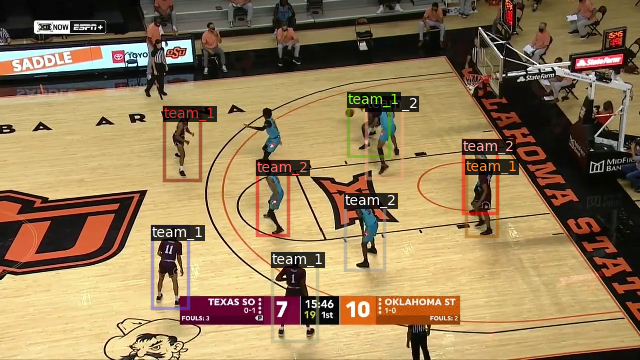

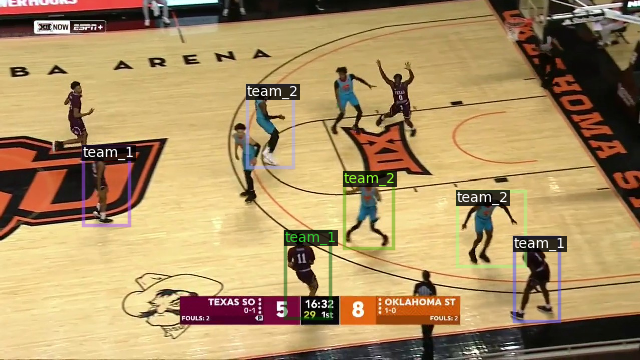

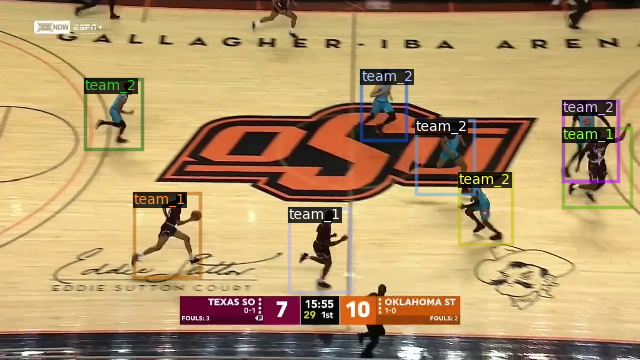

In [5]:
# Убедимся, что датасет в правильном формате
dataset_dicts = DatasetCatalog.get("images_train")
images_metadata = MetadataCatalog.get("images_train")

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=images_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

# Model Training

In [6]:
# Проверим, что Pytorch установлен
import torch, torchvision

print(torch.__version__, torch.cuda.is_available())

2.1.0+cu118 True


In [7]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

import numpy as np

from detectron2 import model_zoo
from detectron2.engine import DefaultTrainer, DefaultPredictor
from detectron2.config import get_cfg

In [9]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_101_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("images_train",)
cfg.DATASETS.TEST = ("images_test",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/retinanet_R_101_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 300
cfg.SOLVER.STEPS = []
cfg.MODEL.RETINANET.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.RETINANET.NUM_CLASSES = 2

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[11/30 20:22:43 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res2)

model_final_971ab9.pkl: 228MB [00:01, 221MB/s]                           
head.cls_score.{bias, weight}
  pixel_mean
  pixel_std


[11/30 20:22:44 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[11/30 20:23:09 d2.utils.events]:  eta: 0:03:12  iter: 19  total_loss: 2.123  loss_cls: 1.631  loss_box_reg: 0.4889    time: 0.7945  last_time: 0.6600  data_time: 0.0250  last_data_time: 0.0083   lr: 1.6068e-05  max_mem: 2849M
[11/30 20:23:27 d2.utils.events]:  eta: 0:02:53  iter: 39  total_loss: 1.489  loss_cls: 1.116  loss_box_reg: 0.3602    time: 0.7739  last_time: 0.6058  data_time: 0.0131  last_data_time: 0.0096   lr: 3.2718e-05  max_mem: 2849M
[11/30 20:23:40 d2.utils.events]:  eta: 0:02:43  iter: 59  total_loss: 1.307  loss_cls: 1.019  loss_box_reg: 0.2863    time: 0.7306  last_time: 0.5772  data_time: 0.0141  last_data_time: 0.0180   lr: 4.9367e-05  max_mem: 2849M
[11/30 20:23:53 d2.utils.events]:  eta: 0:02:31  iter: 79  total_loss: 1.318  loss_cls: 1.021  loss_box_reg: 0.3096    time: 0.7157  last_time: 0.5840  data_time: 0.0127  last_data_time: 0.0176   lr: 6.6017e-05  max_mem: 2849M
[11/30 20:24:07 d2.utils.events]:  eta: 0:02:18  iter: 99  total_loss: 1.035  loss_cls: 0.73

In [10]:
# Посмотрим на кривые обучения в tensorboard
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

# Model evaluation

In [11]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
# cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.7
cfg.TEST.DETECTIONS_PER_IMAGE = 20
predictor = DefaultPredictor(cfg)

[11/30 20:27:28 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


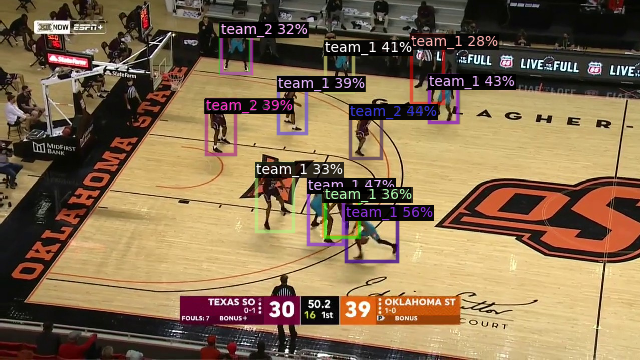

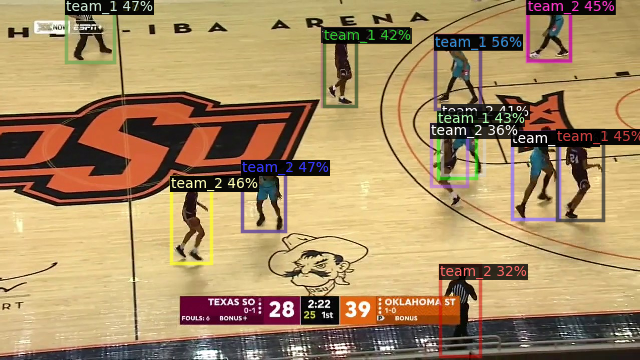

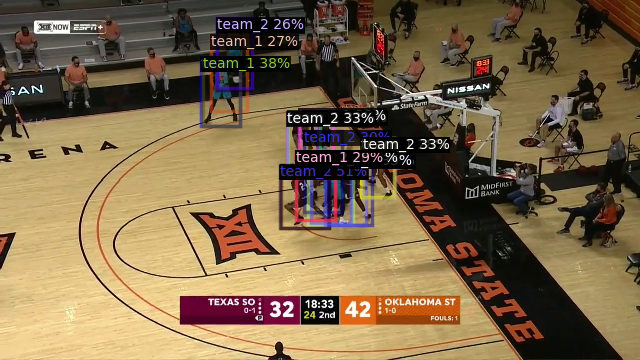

In [12]:
dataset_dicts = DatasetCatalog.get("images_test")
images_metadata = MetadataCatalog.get("images_test")

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    outputs = predictor(img)
    v = Visualizer(
        img[:, :, ::-1],
        metadata=images_metadata,
        scale=0.5,
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

In [13]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

evaluator = COCOEvaluator("images_test", output_dir="./output")
test_loader = build_detection_test_loader(cfg, "images_test")

print(inference_on_dataset(predictor.model, test_loader, evaluator))

[11/30 20:27:49 d2.evaluation.coco_evaluation]: Trying to convert 'images_test' to COCO format ...
[11/30 20:27:49 d2.data.datasets.coco]: Converting annotations of dataset 'images_test' to COCO format ...)
[11/30 20:27:49 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[11/30 20:27:49 d2.data.datasets.coco]: Conversion finished, #images: 100, #annotations: 660
[11/30 20:27:49 d2.data.datasets.coco]: Caching COCO format annotations at './output/images_test_coco_format.json' ...
[11/30 20:27:49 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/30 20:27:49 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[11/30 20:27:49 d2.data.common]: Serializing 100 elements to byte tensors and concatenating them all ...
[11/30 20:27:49 d2.data.common]: Serialized dataset takes 0.05 MiB
[11/30 20:27:49 d2.evaluation.

# IoU

In [20]:
def calculate_iou(box1, box2):
    x_min1, y_min1, x_max1, y_max1 = box1
    x_min2, y_min2, x_max2, y_max2 = box2

    # Находим область пересечения
    x_min_intersect = max(x_min1, x_min2)
    y_min_intersect = max(y_min1, y_min2)
    x_max_intersect = min(x_max1, x_max2)
    y_max_intersect = min(y_max1, y_max2)

    # Находим площади областей и пересечения
    area_box1 = (x_max1 - x_min1) * (y_max1 - y_min1)
    area_box2 = (x_max2 - x_min2) * (y_max2 - y_min2)
    area_intersect = max(0, x_max_intersect - x_min_intersect) * max(0, y_max_intersect - y_min_intersect)

    # Вычисляем IoU
    iou = area_intersect / float(area_box1 + area_box2 - area_intersect)

    return iou

# Возьмем заранее подготовленные данные (ground truth из датасета и predicted bbox)
# otus_basketball_dataset/images_test/095124.jpeg - рассматриваемый пример
box1 = [879.1944394579122, 208.59775425363011, 879.1944394579122 + 98.28995069991599, 208.59775425363011 + 119.10875384439889]
box2 = [891.2242, 204.2444, 970.0834, 318.5555]

iou_value = calculate_iou(box1, box2)
print(f"IoU: {iou_value}")


IoU: 0.7195703950860451
